In [1]:
%autosave 0
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

Autosave disabled


In [2]:
import sys
import os

## Find my mysqlConnector script
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path+"\\ScrapingData")
    
from SqlCo import Sqldd

Objectif du Notebook : Comprendre nos datas et avoir une idée des performances à atteindre avec une librairie d'Auto-Ml

# Init 

In [3]:
modelise_time = False
call_from_bdd = True
pd.set_option('display.max_columns', 500)

In [4]:
if call_from_bdd:
    my_bdd = Sqldd()
    cnx, cursor = my_bdd.get_bdd_co()
    df = pd.read_sql('SELECT * FROM app_hover_public', con=cnx)
    cnx.close()
    cursor.close()
else:
    df = pd.read_csv('../Data/app_hover_public.csv', )

In [ ]:
df

In [7]:
df.sample(3)

,Steam_id,Title,Date_release,Evaluation,Nb_Eval,Nb_game_tags,Game_Tag_1,Game_Tag_2,Game_Tag_3,Game_Tag_4,Game_Tag_5,App_cat,Dev_team,Publisher_team,Os_supported,Prymary_genre,Controller_support,Is_free_app,Nb_language,Workshop_visible,Only_vr_support,Vr_support,Has_adult_content,Nb_achievements,Single_player,Coop_player,Multi_player,Early_Access,Price
10246,404630,One Hundred Ways,2015-10-23,Mixed,14,4,Casual,Indie,Strategy,Puzzle,NaN,Game,Sunlight Games,Sunlight Games,4,Casual,0,0,4,0,0,0,0,0,1,0,0,0,3.99
58984,1285540,Aldroy - Chapter 1,2020-05-01,No,0,8,RPG,Indie,Adventure,Strategy,Open Worl,Game,WZL Game Design,WZL Game Design,1,Adventure,0,0,2,0,0,0,0,64,1,0,0,0,0.00
49477,1088070,HUNTERS FOR YOUR BRAIN,2019-11-09,Mixed,18,7,Singleplayer,Zombies,Indie,Top-Down Shooter,Adventure,Game,REANIMATORUS,khukhrovr,1,Indie,0,0,1,0,0,0,0,0,1,0,0,0,0.00


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59472 entries, 0 to 59471
Data columns (total 29 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Steam_id            59472 non-null  int64  
 1   Title               59469 non-null  object 
 2   Date_release        59472 non-null  object 
 3   Evaluation          59472 non-null  object 
 4   Nb_Eval             59472 non-null  int64  
 5   Nb_game_tags        59472 non-null  int64  
 6   Game_Tag_1          59472 non-null  object 
 7   Game_Tag_2          55273 non-null  object 
 8   Game_Tag_3          47807 non-null  object 
 9   Game_Tag_4          38489 non-null  object 
 10  Game_Tag_5          31347 non-null  object 
 11  App_cat             59445 non-null  object 
 12  Dev_team            56931 non-null  object 
 13  Publisher_team      57492 non-null  object 
 14  Os_supported        59472 non-null  int64  
 15  Prymary_genre       58419 non-null  object 
 16  Cont

In [9]:
## Helper for viz one product
checkid = df[df['Steam_id'].isin([426630])]
checkid

,Steam_id,Title,Date_release,Evaluation,Nb_Eval,Nb_game_tags,Game_Tag_1,Game_Tag_2,Game_Tag_3,Game_Tag_4,Game_Tag_5,App_cat,Dev_team,Publisher_team,Os_supported,Prymary_genre,Controller_support,Is_free_app,Nb_language,Workshop_visible,Only_vr_support,Vr_support,Has_adult_content,Nb_achievements,Single_player,Coop_player,Multi_player,Early_Access,Price
11393,426630,Bubsy Two-Fur,2015-12-17,Mostly Positive,250,16,Action,Adventure,Platformer,Retro,Classic,Game,Accolade,Retroism,1,Adventure,1,0,3,0,0,0,0,0,1,0,1,0,4.99


# Output Visualisation

- Output pour la phase 1 :

In [10]:
def apply_status_reco(df):
    if df['Nb_Eval'] >= 1:
        return 1
    else:
        return 0

C:\Users\utilisateur\AppData\Roaming\Python\Python37\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='status_reco', ylabel='count'>

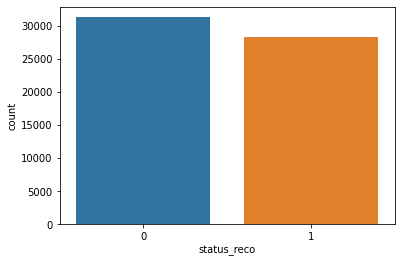

In [11]:
df['status_reco'] = df.apply(apply_status_reco, axis=1)
sns.countplot(df['status_reco'])

- Output pour la phase 2 :

In [12]:
df['Evaluation'].unique()

array(['Overwhelmingly Positive', 'Very Positive', 'Mostly Positive',
       'No', 'Mixed', 'Very Negative', 'Positive', 'Mostly Negative',
       'Negative', 'Overwhelmingly Negative'], dtype=object)

In [13]:
positive = [x for x in df['Evaluation'] if 'Positive' in x]
moyenne = [x for x in df['Evaluation'] if 'Mixed' in x]
negative = [x for x in df['Evaluation'] if 'Negative' in x]

print("Positives : ", len(positive))
print("Negative : ", len(negative))
print("Mixe : ", len(moyenne))

Positives :  19150
Negative :  1539
Mixe :  7525


In [14]:
def apply_value_reco(df):
    if 'Positive' in df['Evaluation']:
        return 1
    else:
        return 0    

C:\Users\utilisateur\AppData\Roaming\Python\Python37\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='Value_reco', ylabel='count'>

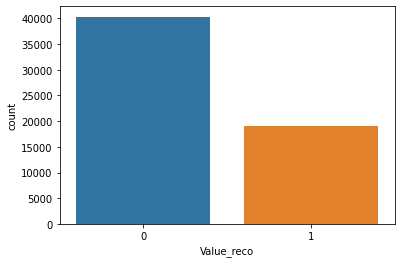

In [15]:
df['Value_reco'] = df.apply(apply_value_reco, axis=1)
sns.countplot(df['Value_reco'])

In [14]:
## Most review
top_20 = df.sort_values("Nb_Eval", axis = 0, ascending = False).head(20)
top_20

,Steam_id,Title,Date_release,Evaluation,Nb_Eval,Nb_game_tags,Game_Tag_1,Game_Tag_2,Game_Tag_3,Game_Tag_4,Game_Tag_5,App_cat,Dev_team,Publisher_team,Os_supported,Prymary_genre,Controller_support,Is_free_app,Nb_language,Workshop_visible,Only_vr_support,Vr_support,Has_adult_content,Nb_achievements,Single_player,Coop_player,Multi_player,Early_Access,Price,status_reco,Value_reco
25,730,Counter-Strike: Global Offensive,2012-08-21,Very Positive,4477929,20,FPS,Shooter,Multiplayer,Competitive,Action,Game,Valve,Valve,4,Free to Play,1,0,29,1,0,0,0,167,0,0,1,0,13.25,1,2.0
22,570,Dota 2,2013-07-09,Very Positive,1315136,20,Free to Play,MOBA,Multiplayer,Strategy,eSports,Game,Valve,Valve,4,Free to Play,0,1,29,1,0,1,0,0,0,0,1,0,0.00,1,2.0
20275,578080,PLAYERUNKNOWN'S BATTLEGROUNDS,2017-12-21,Mixed,1239743,20,Survival,Shooter,Multiplayer,Battle Royale,FPS,Game,PUBG Corporation,PUBG Corporation,1,Action,0,0,17,0,0,0,1,37,0,0,1,0,29.99,1,1.0
3458,271590,Grand Theft Auto V,2015-04-13,Very Positive,783861,20,Open Worl,Action,Multiplayer,Automobile Sim,Third Person,Game,Rockstar North,Rockstar Games,1,Action,1,0,27,0,0,0,1,77,1,0,1,0,0.00,1,2.0
19,440,Team Fortress 2,2007-10-10,Very Positive,675374,20,Free to Play,Hero Shooter,Multiplayer,FPS,Shooter,Game,Valve,Valve,4,Free to Play,1,1,27,1,0,0,0,520,0,0,1,0,0.00,1,2.0
7592,359550,Tom Clancy's Rainbow Six® Siege,2015-12-01,Very Positive,575718,20,FPS,Hero Shooter,Multiplayer,Tactical,Shooter,Game,Ubisoft Montreal,Ubisoft,1,Action,1,0,39,0,0,0,0,0,1,0,1,0,19.99,1,2.0
146,4000,Garry's Mod,2006-11-29,Overwhelmingly Positive,472614,20,Sandbox,Multiplayer,Funny,Moddable,Building,Game,NULL,Valve,4,Indie,0,0,27,1,0,0,0,29,1,0,1,0,9.99,1,2.0
1432,105600,Terraria,2011-05-16,Overwhelmingly Positive,420598,20,Open World Survival Craft,Sandbox,Survival,2D,Adventure,Game,Re-Logic,Re-Logic,4,Indie,1,0,9,0,0,0,0,89,1,1,1,0,9.99,1,2.0
4678,304930,Unturned,2017-07-07,Very Positive,387980,20,Free to Play,Survival,Zombies,Open World Survival Craft,Multiplayer,Game,Smartly Dressed Games,Smartly Dressed Games,4,Free to Play,0,1,1,1,0,0,0,46,1,1,1,0,0.00,1,2.0
2239,230410,Warframe,2013-03-25,Very Positive,360720,20,Free to Play,Looter Shooter,Action,Co-op,Multiplayer,Game,Digital Extremes,Digital Extremes,1,Free to Play,1,1,29,1,0,0,1,193,1,0,1,0,0.00,1,2.0


In [15]:
## Most bad review
worst = df[df['Evaluation'].isin(['Very Negative', 'Mostly Negative','Negative', 'Overwhelmingly Negative'])]
worst_20 = worst.sort_values("Nb_Eval", axis = 0, ascending = False).head(20)
worst_20

,Steam_id,Title,Date_release,Evaluation,Nb_Eval,Nb_game_tags,Game_Tag_1,Game_Tag_2,Game_Tag_3,Game_Tag_4,Game_Tag_5,App_cat,Dev_team,Publisher_team,Os_supported,Prymary_genre,Controller_support,Is_free_app,Nb_language,Workshop_visible,Only_vr_support,Vr_support,Has_adult_content,Nb_achievements,Single_player,Coop_player,Multi_player,Early_Access,Price,status_reco,Value_reco
20258,577800,NBA 2K18,2017-09-14,Mostly Negative,14515,15,Sports,Basketball,Gambling,Multiplayer,Simulation,Game,Visual Concepts,2K,1,Sports,1,0,11,0,0,0,0,50,1,0,1,0,49.99,1,0.0
26597,681660,Bless Online,2018-10-23,Mostly Negative,10231,20,MMORPG,Massively Multiplayer,RPG,Adventure,Open Worl,Game,NEOWIZ BLESS STUDIO,NEOWIZ,1,RPG,0,0,7,0,0,0,0,55,1,1,1,0,0.00,1,0.0
29450,730310,DYNASTY WARRIORS 9,2018-02-13,Mostly Negative,5075,9,Action,Hack and Slash,Open Worl,Historical,Action RPG,Game,"KOEI TECMO GAMES CO, LTD","KOEI TECMO GAMES CO, LTD",1,Action,1,0,23,0,0,0,0,44,1,1,1,0,44.99,1,0.0
22838,619080,SOS,2018-01-23,Mostly Negative,4858,20,Survival,Action,Multiplayer,Adventure,Battle Royale,Game,"Outpost Games, Inc","Outpost Games, Inc",1,Adventure,0,0,17,0,0,0,1,17,0,0,1,0,0.00,1,0.0
2388,236510,Takedown: Red Sabre,2014-02-10,Mostly Negative,3377,20,FPS,Action,Tactical,Simulation,Strategy,Game,Serellan LLC,505 Games,1,Action,1,0,10,0,0,0,0,0,1,0,1,0,4.99,1,0.0
2603,246090,Spacebase DF-9,2014-10-27,Overwhelmingly Negative,3166,17,Simulation,Space,Sci-f,Base Building,Strategy,Game,Double Fine Productions,Double Fine Productions,4,Simulation,0,0,1,0,0,0,0,0,1,0,0,0,9.99,1,0.0
3771,282560,RollerCoaster Tycoon World™,2016-11-16,Mostly Negative,2808,14,Simulation,Building,Management,Strategy,Sandbox,Game,Nvizzio Creations,Atari,1,Simulation,1,0,9,1,0,0,0,30,1,0,0,0,14.99,1,0.0
2961,258180,Deus Ex: The Fall,2014-03-17,Mostly Negative,2631,19,Cyberpunk,RPG,Action,Stealth,Sci-f,Game,Square Enix,Square Enix,1,RPG,1,0,11,0,0,0,0,28,1,0,0,0,9.99,1,0.0
3110,261980,Half-Life: Before,2013-12-03,Mostly Negative,2440,20,Free to Play,Action,Adventure,Mo,Multiplayer,Game,Creashock studios,Creashock studios,1,Action,0,1,3,0,0,0,0,0,1,0,0,0,0.00,1,0.0
1100,47700,Command & Conquer 4: Tiberian Twilight,2010-03-17,Overwhelmingly Negative,2400,6,Strategy,RTS,Multiplayer,Sci-f,Co-op,Game,EA Los Angeles,Electronic Arts,1,Strategy,0,0,7,0,0,0,0,0,1,0,1,0,0.00,1,0.0


In [16]:
## Most Mixed review
Mixed = df[df['Evaluation'].isin(['Mixed'])]
Mixed_20 = Mixed.sort_values("Nb_Eval", axis = 0, ascending = False).head(20)
Mixed_20

,Steam_id,Title,Date_release,Evaluation,Nb_Eval,Nb_game_tags,Game_Tag_1,Game_Tag_2,Game_Tag_3,Game_Tag_4,Game_Tag_5,App_cat,Dev_team,Publisher_team,Os_supported,Prymary_genre,Controller_support,Is_free_app,Nb_language,Workshop_visible,Only_vr_support,Vr_support,Has_adult_content,Nb_achievements,Single_player,Coop_player,Multi_player,Early_Access,Price,status_reco,Value_reco
20275,578080,PLAYERUNKNOWN'S BATTLEGROUNDS,2017-12-21,Mixed,1239743,20,Survival,Shooter,Multiplayer,Battle Royale,FPS,Game,PUBG Corporation,PUBG Corporation,1,Action,0,0,17,0,0,0,1,37,0,0,1,0,29.99,1,1.0
11783,433850,Z1 Battle Royale,2018-02-28,Mixed,208703,20,Survival,Massively Multiplayer,Multiplayer,Open Worl,Battle Royale,Game,Daybreak Game Company,Daybreak Game Company,1,Free to Play,0,1,9,0,0,0,0,0,0,0,1,0,0.00,1,1.0
2020,221100,DayZ,2018-12-13,Mixed,195725,20,Survival,Zombies,Multiplayer,Open Worl,Action,Game,Bohemia Interactive,Bohemia Interactive,1,Action,0,0,22,1,0,0,0,0,0,0,1,0,39.99,1,1.0
3587,275850,No Man's Sky,2016-08-12,Mixed,129266,20,Open Worl,Open World Survival Craft,Space,Exploration,Sci-f,Game,Hello Games,Hello Games,1,Action,1,0,27,0,0,1,0,27,1,1,1,0,54.99,1,1.0
2191,227940,Heroes & Generals,2016-10-18,Mixed,119702,20,Free to Play,World War II,FPS,Multiplayer,War,Game,RETO MOTO,RETO MOTO,1,Free to Play,0,1,12,0,0,0,0,0,0,1,1,0,0.00,1,1.0
4259,295110,Just Survive,2015-01-15,Mixed,65879,20,Zombies,Survival,Open Worl,Multiplayer,Massively Multiplayer,Game,Daybreak Game Company,Daybreak Game Company,1,Adventure,0,0,2,0,0,0,1,0,0,0,1,0,0.00,1,1.0
7974,365590,Tom Clancy’s The Division™,2016-03-07,Mixed,61943,20,Open Worl,Multiplayer,Third-Person Shooter,Looter Shooter,Action,Game,Massive Entertainment,Ubisoft,1,Action,0,0,42,0,0,0,0,0,1,0,1,0,29.99,1,1.0
4099,291480,Warface,2014-07-01,Mixed,57726,20,Free to Play,FPS,Multiplayer,Shooter,Action,Game,MYGAMES,MYGAMES,1,Action,0,1,23,0,0,0,0,30,0,1,1,0,0.00,1,1.0
371,12210,Grand Theft Auto IV: The Complete Edition,2020-03-24,Mixed,53963,20,Open Worl,Action,Bowling,Automobile Sim,Multiplayer,Game,Rockstar North,Rockstar Games,1,Action,1,0,11,0,0,0,0,55,1,0,1,0,19.99,1,1.0
11296,424370,Wolcen: Lords of Mayhem,2020-02-13,Mixed,50594,20,RPG,Hack and Slash,Action RPG,Action,Multiplayer,Game,WOLCEN Studio,WOLCEN Studio,1,Action,0,0,19,0,0,0,0,61,1,1,1,0,34.99,1,1.0


- Output pour la phase 3 :

In [17]:
## This df will be used for create train/test on phase 2 & 3

df_n_phase = df[df["status_reco"].isin([1])]
df_n_phase.shape 

(28214, 31)

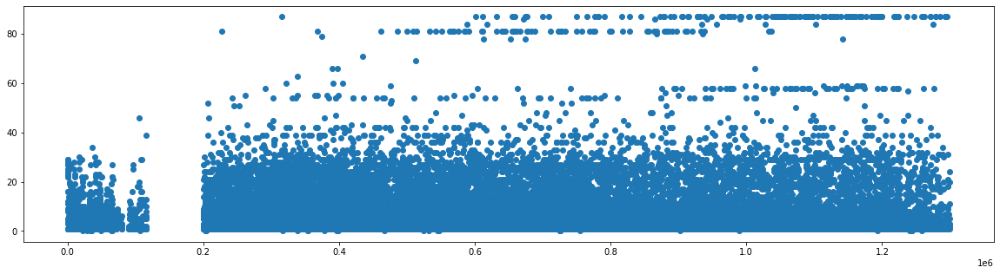

In [18]:
plt.figure(figsize=(20,5))
plt.scatter(df_n_phase["Steam_id"],df_n_phase["Nb_language"])

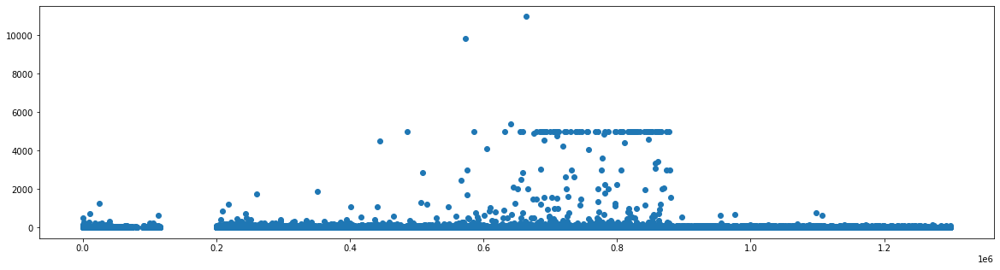

In [19]:
plt.figure(figsize=(20,5))
plt.scatter(df_n_phase["Steam_id"],df_n_phase["Nb_achievements"])

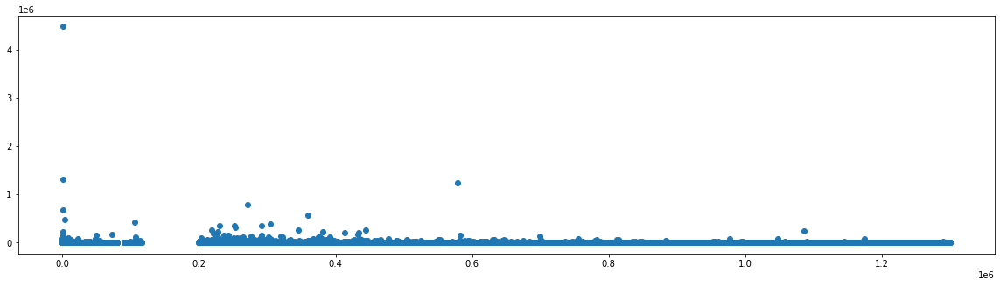

In [20]:
plt.figure(figsize=(20,5))
plt.scatter(df_n_phase["Steam_id"],df_n_phase["Nb_Eval"])

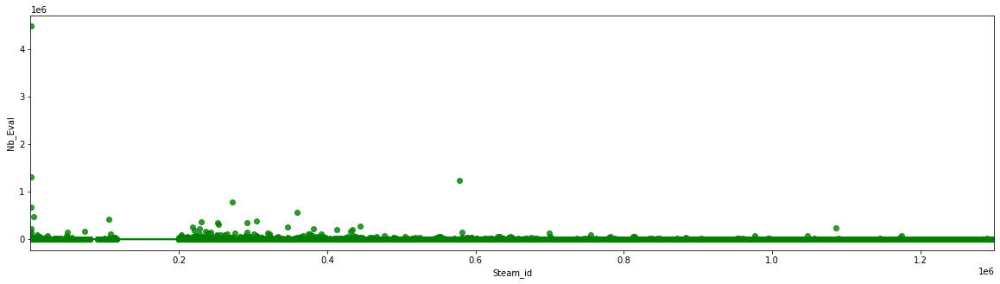

In [21]:
plt.figure(figsize=(20,5))
sns.regplot(df_n_phase["Steam_id"],df_n_phase["Nb_Eval"], color="g")

# Features Exploration

In [22]:
df.columns

Index(['Steam_id', 'Title', 'Date_release', 'Evaluation', 'Nb_Eval',
       'Nb_game_tags', 'Game_Tag_1', 'Game_Tag_2', 'Game_Tag_3', 'Game_Tag_4',
       'Game_Tag_5', 'App_cat', 'Dev_team', 'Publisher_team', 'Os_supported',
       'Prymary_genre', 'Controller_support', 'Is_free_app', 'Nb_language',
       'Workshop_visible', 'Only_vr_support', 'Vr_support',
       'Has_adult_content', 'Nb_achievements', 'Single_player', 'Coop_player',
       'Multi_player', 'Early_Access', 'Price', 'status_reco', 'Value_reco'],
      dtype='object')

In [23]:
df["App_cat"].unique()

array(['Game', 'Legacy Media', 'Application', 'Demo', 'Config', '',
       'Downloadable Content', 'Tool', 'Music', 'Unknown', 'Video',
       'Series', 'Hardware'], dtype=object)

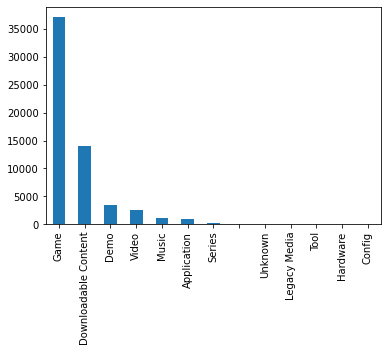

In [24]:
df.App_cat.value_counts().plot.bar()

In [25]:
df["Prymary_genre"].unique()

array(['Action', 'Free to Play', 'Strategy', 'Indie', 'RPG',
       'Video Production', 'Unknown Genre', 'Casual', 'Simulation',
       'Racing', 'Adventure', 'Sports', 'Massively Multiplayer', '',
       'Animation & Modeling', 'Early Access', 'NULL', 'Utilities',
       'Audio Production', 'Design & Illustration', 'Photo Editing',
       'Violent', 'Web Publishing', 'Education', 'Game Development',
       'Software Training', 'Accounting', 'Nudity', 'Gore',
       'Sexual Content'], dtype=object)

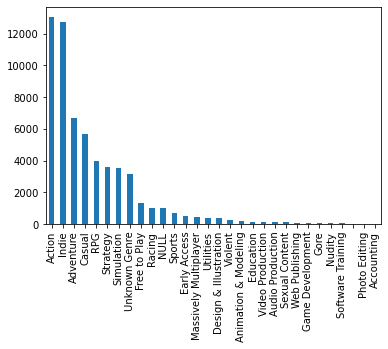

In [26]:
df.Prymary_genre.value_counts().plot.bar()

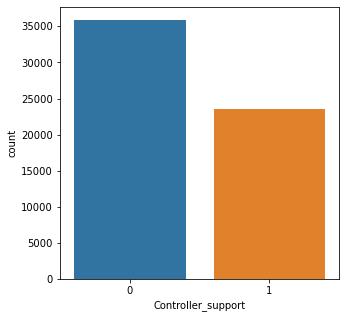

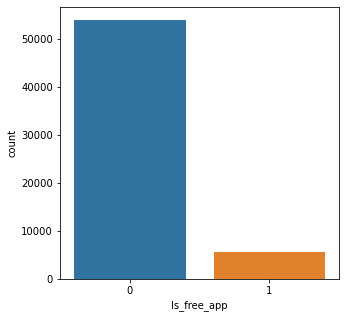

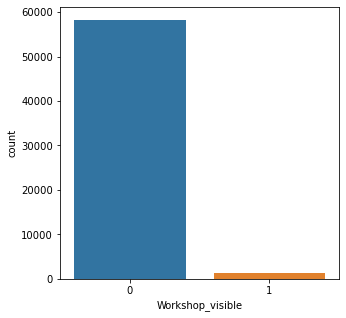

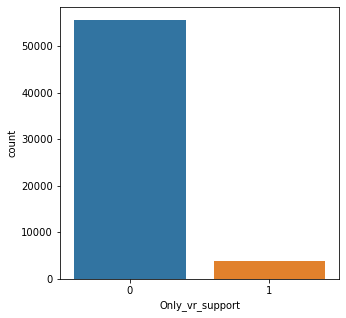

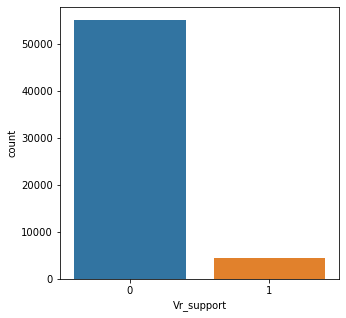

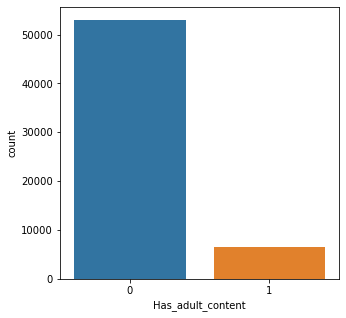

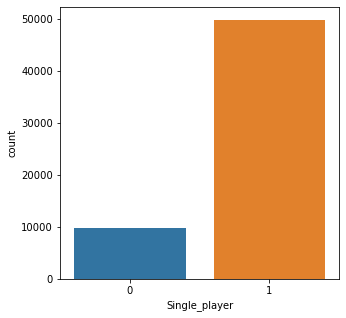

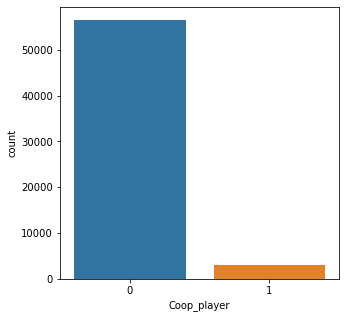

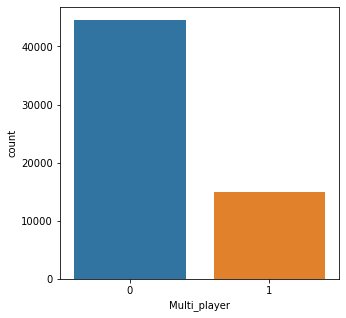

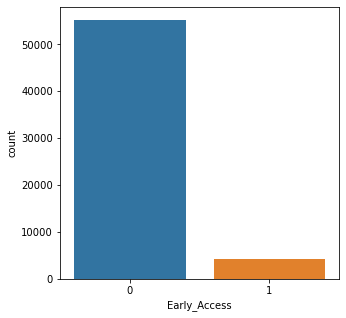

In [27]:
col_bool = ['Controller_support', 'Is_free_app',
       'Workshop_visible', 'Only_vr_support', 'Vr_support',
       'Has_adult_content', 'Single_player', 'Coop_player',
       'Multi_player','Early_Access']

for i in col_bool:
    plt.figure(figsize=(5,5))
    sns.countplot(df[i])
    plt.show()

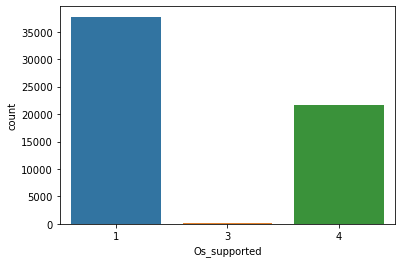

In [28]:
sns.countplot(df["Os_supported"])

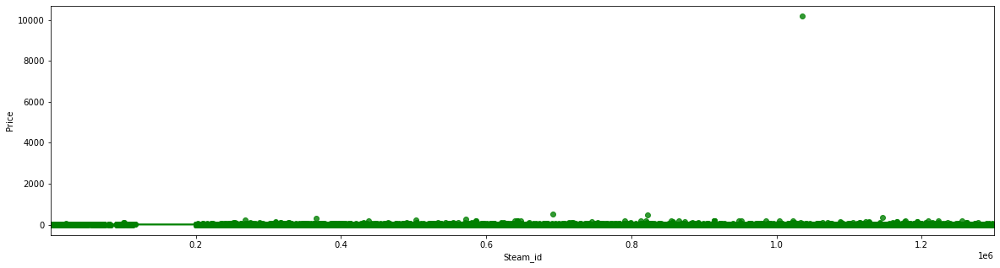

In [29]:
plt.figure(figsize=(20,5))
sns.regplot(df["Steam_id"],df["Price"], color="g")

In [30]:
df["Price"].describe()

count    59472.000000
mean         6.246265
std         42.865207
min          0.000000
25%          0.000000
50%          3.290000
75%          8.190000
max      10170.000000
Name: Price, dtype: float64

In [31]:
df.Dev_team.value_counts().head(20)

NULL                              2512
SmiteWorks USA, LLC               1442
KOEI TECMO GAMES CO, LTD           344
Choice of Games                    244
Ubisoft - San Francisco            178
N3V Games                          168
Lionsgate                          168
Milestone Srl                      133
Hosted Games                       127
Paradox Development Studio          96
Laush Dmitriy Sergeevich            94
Square Enix                         79
Nikita &quot;Ghost_RUS&quot;        77
Creobit                             68
INTI CREATES CO, LTD                68
Mia Blais-Côté                      66
SCS Software                        65
Ubisoft Montreal                    64
Stegalosaurus Game Development      64
Ripknot Systems                     63
Name: Dev_team, dtype: int64

In [32]:
df.Publisher_team.value_counts().head(20)

NULL                          1932
SmiteWorks USA, LLC           1442
Degica                         440
KOEI TECMO GAMES CO, LTD       353
Big Fish Games                 344
Choice of Games                244
SEGA                           240
Lionsgate                      237
Square Enix                    221
Paradox Interactive            218
Ubisoft                        214
N3V Games                      188
Sekai Project                  184
THQ Nordic                     171
BANDAI NAMCO Entertainment     157
Slitherine Ltd                 155
Ubisoft - San Francisco        152
2K                             149
Strategy First                 148
Plug In Digital                138
Name: Publisher_team, dtype: int64

# Relation Target/Features

In [33]:
filt_df = pd.DataFrame(df, columns=['Date_release', 'Evaluation', 'Nb_Eval','Nb_game_tags',
                                    'App_cat','Os_supported','Prymary_genre', 
                                    'Controller_support', 'Is_free_app', 'Nb_language',
                                    'Workshop_visible', 'Only_vr_support', 'Vr_support',
                                    'Has_adult_content', 'Nb_achievements', 'Single_player', 
                                    'Coop_player','Multi_player', 'Early_Access', 'Price', 
                                    'status_reco', 'Value_reco'])

In [34]:
corr = filt_df.corr().abs()
corr.status_reco[corr.status_reco >= 0.01].sort_values(ascending=False)
# plt.figure(figsize=(20,10))
# sns.heatmap(corr,annot=True)

status_reco           1.000000
Nb_game_tags          0.391916
Nb_language           0.152698
Is_free_app           0.150404
Single_player         0.147686
Workshop_visible      0.119075
Nb_achievements       0.074763
Coop_player           0.065619
Multi_player          0.055372
Controller_support    0.042321
Early_Access          0.041969
Has_adult_content     0.035871
Nb_Eval               0.035228
Price                 0.029320
Only_vr_support       0.012321
Os_supported          0.011174
Name: status_reco, dtype: float64

In [35]:
corr = filt_df.corr().abs()
corr.Value_reco[corr.Value_reco >= 0.01].sort_values(ascending=False)
# plt.figure(figsize=(20,10))
# sns.heatmap(corr,annot=True)

Value_reco            1.000000
Nb_game_tags          0.134518
Os_supported          0.123695
Controller_support    0.111636
Early_Access          0.080366
Nb_language           0.062133
Workshop_visible      0.057487
Multi_player          0.050889
Price                 0.045022
Single_player         0.025616
Vr_support            0.021168
Nb_Eval               0.020735
Has_adult_content     0.017275
Only_vr_support       0.017168
Coop_player           0.012696
Is_free_app           0.011418
Name: Value_reco, dtype: float64

In [36]:
corr = filt_df.corr().abs()
corr.Nb_Eval[corr.Nb_Eval >= 0.01].sort_values(ascending=False)
# plt.figure(figsize=(20,10))
# sns.heatmap(corr,annot=True)

Nb_Eval               1.000000
Workshop_visible      0.080894
Nb_game_tags          0.073004
Nb_language           0.042116
status_reco           0.035228
Multi_player          0.033046
Coop_player           0.021649
Value_reco            0.020735
Controller_support    0.016168
Is_free_app           0.013942
Single_player         0.013320
Os_supported          0.012546
Name: Nb_Eval, dtype: float64

In [37]:
filt_df_phase1 = filt_df.drop(columns=['Evaluation','Value_reco','Nb_Eval','Nb_game_tags', 'App_cat'])

In [41]:
def parallel(inc_df):
    fig = px.parallel_coordinates(inc_df, color="status_reco",
                                 color_continuous_scale=px.colors.diverging.Tealrose,
                                 color_continuous_midpoint=2)
    fig.show()

In [42]:
parallel(filt_df_phase1)

# Observations Dataset

- Générale :

     - Les produits ayant un nombre d'évaluation inférieur au seuil nécessaire pour avoir une évalution globale ont étaient          ramené à 0 évaluation, dans ce projet on va considerer que c'est insufisant.(fait pendant le scraping)
     
     - Les bundles n'ont pas d'ID qui finissent par 0 et n'ont pas étaient scrap. Ils sont forcément à 0 car on ne peut pas 
     laisser d'évaluation dessus, donc à verfier.

- Data :
    - Les colonnes Game_Tag et Nb_game_tags ne seront pas utilisées pour la modélisation. Ces éléments sont rajoutés par les         joueurs eux même, bien entendu les dev peuvent utiliser leur compte perso pour en mettre. Ces tags servent à                     référencer le produit dans des categories, ainsi lorsqu'un joueur fait une recherche par genre le produit peut                   apparaitre dans la liste.
    
    - Les prix sont en Euro mais attention de nombreux produits sont en solde (et ont étaient scrapé à 0.0) et certains prix ont évolués au fil du temps.
    
    - Pour les produits les plus anciens il n'y avait pas de distinction entre Dev_team/Editeur, la colonne Dev_team a pour           valeur NULL. Il y'a aussi parfois dans la source de scrap des liens vers le site des dev alors le scraping a retourné NULL.
    - Les lignes ou il y'a des NA, les infos des app étaient pas présente dans la source scrapée.

- Features engineering possible : 
    - créer une colonnes si éditeur != dev (attention cependant au studio rattaché ex : Rockstart et Rockstart England),
    - créer une colonne pour savoir si editeur et dev sont expérimentés si ils appartiennent à la liste des top
    - features polynomiales pour les features bool

- output : 
    - phase 1 : classes équilibrées
    - phase 2 : classes déséquilibrées (Compter les mixed avec les négatifs ??)
    - phase 3 : Supprimer les outliers ( ceux au dessus de 200 000, ou seulement les 3 premiers ?), Supprimer les No review du       data set.
                

- conclusion :
     - refaire un scrap pour les prix une fois la prériode de solde ternimée mais il y'aura toujours du biais
     (640310 Id scrap quand les soldes ont commencées)

In [39]:
if not modelise_time:
    raise Exception("Stop Job")

Exception: Stop Job

# Auto-Ml Phase1

In [ ]:
from pycaret.classification import *

In [ ]:
df.columns

In [ ]:
ds_f1_df = df.drop(columns=['Steam_id', 'Title', 'Date_release', 'Evaluation', 'Nb_Eval',
                        'Price','Game_Tag_1', 'Game_Tag_2', 'Game_Tag_3', 'Game_Tag_4','Game_Tag_5',
                        'Dev_team', 'Publisher_team','Nb_game_tags','Value_reco'])

In [ ]:
ds_f1_df.head(3)

In [39]:
exp_clf = setup(ds_f1_df, target = 'status_reco', silent=True, session_id=69,
                numeric_features=['Os_supported','Controller_support', 'Is_free_app', 'Nb_language',
                                   'Workshop_visible', 'Only_vr_support', 'Vr_support',
                                   'Has_adult_content', 'Nb_achievements', 'Single_player', 'Coop_player',
                                   'Multi_player', 'Early_Access',])

 
Setup Succesfully Completed!


,Description,Value
0,session_id,69
1,Target Type,Binary
2,Label Encoded,None
3,Original Data,"(59472, 16)"
4,Missing Values,True
5,Numeric Features,13
6,Categorical Features,2
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


In [40]:
compare_models(blacklist=['xgboost']) ## xgboost kill kernel :(

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,CatBoost Classifier,0.751000,0.836000,0.722300,0.745200,0.733500,0.500000
1,Light Gradient Boosting Machine,0.749500,0.833900,0.728500,0.739800,0.734000,0.497400
2,Gradient Boosting Classifier,0.741000,0.823800,0.700900,0.739700,0.719700,0.479200
3,Ada Boost Classifier,0.733300,0.815400,0.696600,0.729300,0.712500,0.464000
4,Random Forest Classifier,0.727100,0.799000,0.681400,0.726500,0.703100,0.451100
5,Extra Trees Classifier,0.724200,0.778400,0.661300,0.731700,0.694700,0.444400
6,Logistic Regression,0.720600,0.802300,0.735200,0.694000,0.714000,0.441300
7,K Neighbors Classifier,0.716600,0.780900,0.684800,0.708300,0.696200,0.430700
8,Ridge Classifier,0.715700,0.000000,0.756800,0.680100,0.716400,0.433000
9,Linear Discriminant Analysis,0.715700,0.798000,0.756900,0.680000,0.716400,0.433000


In [41]:
model = create_model('catboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.7475,0.8303,0.7139,0.7437,0.7285,0.4928
1,0.7521,0.8363,0.7276,0.7442,0.7358,0.5024
2,0.7485,0.8304,0.7382,0.7334,0.7358,0.4958
3,0.7591,0.8413,0.7322,0.7531,0.7425,0.5162
4,0.7502,0.8414,0.7210,0.7444,0.7325,0.4983
5,0.7480,0.8322,0.7180,0.7424,0.7300,0.4939
6,0.7547,0.8447,0.7175,0.7537,0.7351,0.5070
7,0.7459,0.8265,0.7195,0.7382,0.7287,0.4897
8,0.7521,0.8390,0.7291,0.7434,0.7362,0.5024
9,0.7523,0.8383,0.7058,0.7560,0.7300,0.5018


In [42]:
## SystemExit: (Estimator Error): CatBoost estimator is not compatible with plot_model function, 
## try using Catboost with interpret_model instead.

# plot_model(model, plot='feature')

In [43]:
#plot_model(model, plot = 'confusion_matrix')

In [44]:
# plot_model(model, plot='learning')

In [45]:
# optimize_threshold(model, true_negative = 2000, false_negative = -5000)

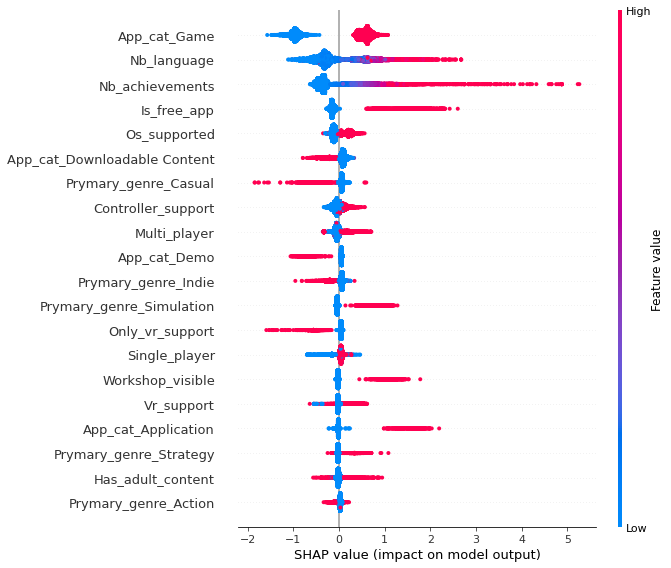

In [46]:
interpret_model(model)

# Auto-Ml Phase2

In [47]:
ds_f2_df = df_n_phase.drop(columns=['Steam_id', 'Title', 'Date_release', 'Evaluation', 'Nb_Eval',
                        'Price','Game_Tag_1', 'Game_Tag_2', 'Game_Tag_3', 'Game_Tag_4','Game_Tag_5',
                        'Dev_team', 'Publisher_team','Nb_game_tags','status_reco'])

In [48]:
exp_clf = setup(ds_f2_df, target = 'Value_reco', silent=True, session_id=69,
                numeric_features=['Os_supported','Controller_support', 'Is_free_app', 'Nb_language',
                                   'Workshop_visible', 'Only_vr_support', 'Vr_support',
                                   'Has_adult_content', 'Nb_achievements', 'Single_player', 'Coop_player',
                                   'Multi_player', 'Early_Access',])

 
Setup Succesfully Completed!


,Description,Value
0,session_id,69
1,Target Type,Multiclass
2,Label Encoded,None
3,Original Data,"(28214, 16)"
4,Missing Values,True
5,Numeric Features,13
6,Categorical Features,2
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


In [49]:
compare_models(blacklist=['xgboost'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,Light Gradient Boosting Machine,0.683400,0.000000,0.355100,0.624200,0.589900,0.072400
1,Gradient Boosting Classifier,0.682600,0.000000,0.346800,0.605100,0.576800,0.048200
2,Ridge Classifier,0.682200,0.000000,0.344700,0.605100,0.572600,0.040500
3,Linear Discriminant Analysis,0.681900,0.000000,0.347100,0.600200,0.577700,0.049200
4,Logistic Regression,0.681700,0.000000,0.343700,0.598900,0.570900,0.037900
5,Ada Boost Classifier,0.681400,0.000000,0.347700,0.597300,0.579000,0.051400
6,CatBoost Classifier,0.680800,0.000000,0.355100,0.608100,0.590200,0.071800
7,K Neighbors Classifier,0.640900,0.000000,0.357900,0.572200,0.592100,0.072200
8,Random Forest Classifier,0.633000,0.000000,0.375100,0.584400,0.601900,0.106800
9,Decision Tree Classifier,0.626400,0.000000,0.362600,0.571300,0.590300,0.077000


In [50]:
model_f2 = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.6263,0.0,0.3677,0.5764,0.5950,0.0889
1,0.6294,0.0,0.3692,0.5786,0.5971,0.0931
2,0.6228,0.0,0.3725,0.5776,0.5948,0.0918
3,0.6395,0.0,0.3946,0.5980,0.6126,0.1319
4,0.6511,0.0,0.3861,0.6026,0.6196,0.1477
5,0.6157,0.0,0.3621,0.5669,0.5853,0.0728
6,0.6339,0.0,0.3771,0.5866,0.6034,0.1095
7,0.6339,0.0,0.3738,0.5823,0.5993,0.0993
8,0.6400,0.0,0.3641,0.5821,0.6025,0.1072
9,0.6378,0.0,0.3837,0.5931,0.6095,0.1259


In [51]:
## Feature Importance plot not available for estimators that doesnt support coef_ or feature_importances_ attribute.
#plot_model(model_f2, plot='feature')

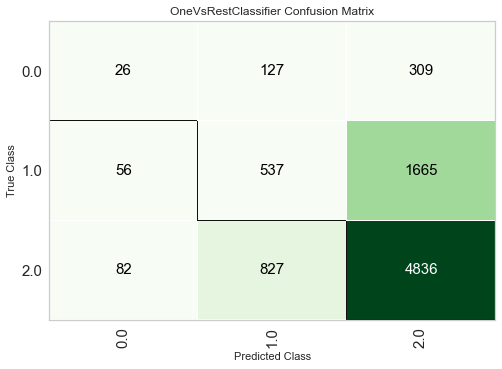

In [52]:
plot_model(model_f2, plot = 'confusion_matrix')

In [53]:
## SystemExit: (Type Error) optimize_threshold() cannot be used when target is multi-class. 
# optimize_threshold(model_f2, true_negative = 2000, false_negative = -5000)

- Test avec seulement 2 classes, en combinant les bad et mixed reviuew pour re equilibrer les classes

In [54]:
def apply_value_reco_2(df):
    if 'Positive' in df['Evaluation']:
        return 1
    else:
        return 0  

In [55]:
ds_f2_df_v2 = ds_f2_df

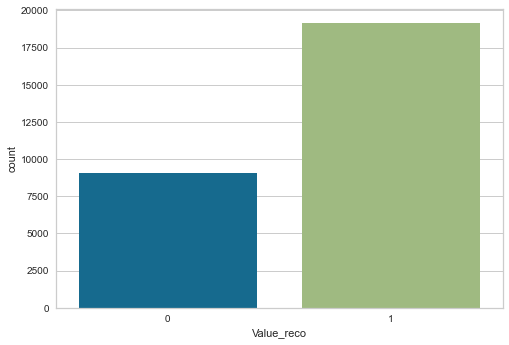

In [56]:
ds_f2_df_v2['Value_reco'] = df.apply(apply_value_reco_2, axis=1)
sns.countplot(ds_f2_df_v2['Value_reco'])

In [57]:
exp_clf = setup(ds_f2_df_v2, target = 'Value_reco', silent=True, session_id=69,
                numeric_features=['Os_supported','Controller_support', 'Is_free_app', 'Nb_language',
                                   'Workshop_visible', 'Only_vr_support', 'Vr_support',
                                   'Has_adult_content', 'Nb_achievements', 'Single_player', 'Coop_player',
                                   'Multi_player', 'Early_Access',])

 
Setup Succesfully Completed!


,Description,Value
0,session_id,69
1,Target Type,Binary
2,Label Encoded,None
3,Original Data,"(28214, 16)"
4,Missing Values,True
5,Numeric Features,13
6,Categorical Features,2
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


In [58]:
compare_models(blacklist=['xgboost'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,CatBoost Classifier,0.692200,0.675200,0.931400,0.707600,0.804200,0.143400
1,Light Gradient Boosting Machine,0.691000,0.670500,0.937900,0.704600,0.804700,0.131500
2,Gradient Boosting Classifier,0.690300,0.663300,0.961400,0.697100,0.808200,0.099900
3,Logistic Regression,0.689100,0.640700,0.959900,0.696700,0.807400,0.097300
4,Ridge Classifier,0.686900,0.000000,0.962000,0.694500,0.806600,0.086400
5,Linear Discriminant Analysis,0.686700,0.643600,0.949300,0.697900,0.804400,0.101600
6,Ada Boost Classifier,0.685700,0.653900,0.942700,0.699100,0.802800,0.106000
7,K Neighbors Classifier,0.647700,0.594400,0.815900,0.709000,0.758700,0.118200
8,Random Forest Classifier,0.642400,0.619100,0.769800,0.721700,0.745000,0.148400
9,Extra Trees Classifier,0.630500,0.608800,0.751800,0.717300,0.734100,0.129400


In [59]:
model_f2_v2 = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.6952,0.6800,0.9448,0.7058,0.8080,0.1381
1,0.6982,0.6752,0.9426,0.7089,0.8092,0.1519
2,0.6891,0.6544,0.9344,0.7043,0.8032,0.1280
3,0.6886,0.6611,0.9389,0.7026,0.8037,0.1208
4,0.6866,0.6522,0.9239,0.7054,0.8000,0.1325
5,0.6967,0.6839,0.9537,0.7041,0.8101,0.1345
6,0.6780,0.6673,0.9224,0.6991,0.7954,0.1028
7,0.6871,0.6714,0.9373,0.7017,0.8026,0.1185
8,0.7003,0.6890,0.9485,0.7085,0.8111,0.1538
9,0.6900,0.6708,0.9321,0.7056,0.8032,0.1343


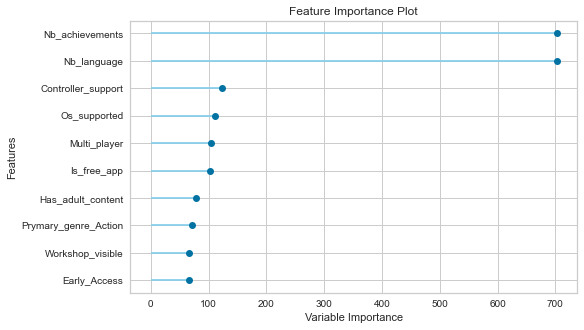

In [60]:
plot_model(model_f2_v2, plot='feature')

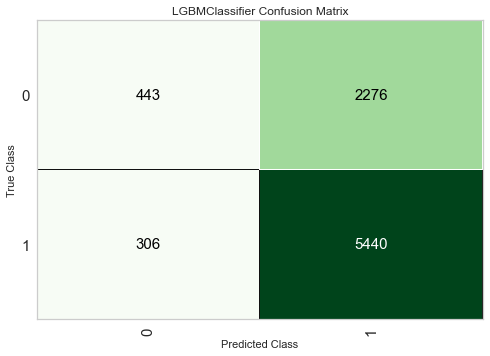

In [61]:
plot_model(model_f2_v2, plot='confusion_matrix')

In [62]:
 # plot_model(model_f2_v2, plot='learning') 

In [63]:
optimize_threshold(model_f2_v2, true_negative = 3000, false_negative = -5000)

Optimized Probability Threshold: 0.39 | Optimized Cost Function: 87000


# Auto-Ml Phase3

In [64]:
from pycaret.regression import *

In [65]:
ds_f3_df = df_n_phase.drop(columns=['Steam_id', 'Title', 'Date_release', 'Evaluation',
                        'Price','Game_Tag_1', 'Game_Tag_2', 'Game_Tag_3', 'Game_Tag_4','Game_Tag_5',
                        'Dev_team', 'Publisher_team','Nb_game_tags','status_reco','Value_reco'])

In [66]:
exp_reg101 = setup(ds_f3_df, target = 'Nb_Eval',remove_outliers=True, session_id=69,
                   numeric_features=['Os_supported','Controller_support', 'Is_free_app', 'Nb_language',
                                   'Workshop_visible', 'Only_vr_support', 'Vr_support',
                                   'Has_adult_content', 'Nb_achievements', 'Single_player', 'Coop_player',
                                   'Multi_player', 'Early_Access',]) 

 
Setup Succesfully Completed!


,Description,Value
0,session_id,69
1,Transform Target,False
2,Transform Target Method,None
3,Original Data,"(28214, 16)"
4,Missing Values,True
5,Numeric Features,13
6,Categorical Features,2
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


In [67]:
compare_models(blacklist=['xgboost'],sort='MAPE', round=2)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Support Vector Machine,1723.710000,1423151792.640000,24095.070000,-0.010000,1.760000,1.430000
1,Huber Regressor,1720.770000,1422384397.320000,24076.980000,-0.010000,1.680000,2.300000
2,TheilSen Regressor,1897.450000,1417942979.130000,23985.290000,0.010000,2.150000,10.750000
3,Decision Tree,2816.440000,1677663898.410000,31100.140000,-2.340000,2.090000,13.620000
4,Passive Aggressive Regressor,2171.280000,1439193622.120000,24848.050000,-0.200000,2.220000,15.130000
5,Extra Trees Regressor,2770.030000,2196556888.460000,34990.200000,-7.970000,2.030000,16.950000
6,K Neighbors Regressor,2531.570000,1487652803.550000,26793.180000,-0.720000,2.050000,17.720000
7,CatBoost Regressor,2557.070000,1453695000.700000,27259.440000,-1.680000,2.390000,19.250000
8,Random Forest,2588.140000,1285540851.900000,25182.460000,-0.610000,2.120000,19.580000
9,Gradient Boosting Regressor,2501.580000,1337254173.930000,24826.970000,-0.640000,2.380000,20.320000


In [68]:
regre_model = create_model('svm')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,1400.7105,1.406818e+08,11860.9368,-0.0122,1.7933,1.4060
1,4587.3450,1.170531e+10,108191.0785,-0.0017,1.8010,1.3960
2,2200.8063,1.124199e+09,33529.0697,-0.0041,1.7947,1.3752
3,952.3321,2.870590e+07,5357.7884,-0.0267,1.7316,1.3980
4,1625.0575,3.790858e+08,19470.1268,-0.0060,1.8242,1.4378
5,1280.1021,1.144295e+08,10697.1724,-0.0123,1.7461,1.4406
6,983.4126,6.168637e+07,7854.0670,-0.0128,1.6476,1.4608
7,1402.0536,1.089496e+08,10437.8934,-0.0156,1.8244,1.4461
8,1236.9083,2.281687e+08,15105.2543,-0.0059,1.6610,1.4255
9,1568.3405,3.403022e+08,18447.2819,-0.0063,1.7635,1.4920


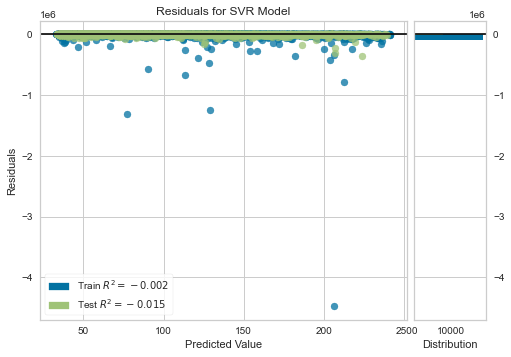

In [69]:
plot_model(regre_model)

In [70]:
## Feature Importance plot not available for estimators with coef_ attribute.
# plot_model(regre_model, plot='feature')

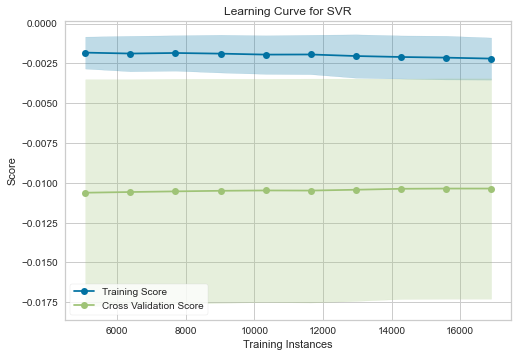

In [71]:
plot_model(regre_model, plot='learning')

In [72]:
# This function only supports tree based models.
# interpret_model(regre_model)

# Observation AutoMl

Premiere phase AutoMl sans trop toucher aux options, voici les 3 gagnants :

                        	
- phase 1 : CatBoost Classifier :
    - Accuracy = 0.75
    - Auc = 0.836
    - Recall = 0.722
    - Prec = 0.744
    - F1 = 0.733
    - Kappa = 0.498
		
        
- phase 2 : Light GradientBM	    					
    - Accuracy = 0.693
    - Auc = 0.671
    - Recall = 0.939
    - Prec = 0.705
    - F1 = 0.805
    - Kappa = 0.136


- phase 3 : Support Vector Machine	        	      	     
    - MAE = 1665.83	
    - MSE = 1417950917.62	
    - RMSE = 25740.26
    - R2 = -0.010
    - RMSLE = 1.75
    - MAPE = 1.42
    
sans suprise la classification multiple donne de moins bon resultat on conserve l'idée de mettre les revieuw négative et mixe ensemble.